# sgis

Github: https://github.com/statisticsnorway/ssb-sgis

Åpne heller notebooken her: https://nbviewer.org/github/statisticsnorway/intro_til_geopandas/blob/main/8_ssb_sgis.ipynb

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import sgis as sg

For å installere:

poetry add ssb-sgis

Eller:

pip install ssb-sgis

## Pakken inneholder:
- Funksjoner for bedre kartlegging (se egen notebook 'kartlegging')
- Nettverksanalyse (se egen notebook 'nettverksanalyse')
- GIS-funksjoner som mangler i geopandas

Henter først bygningspunkter.

In [2]:
aar = 2024

bygningspunktsti = f"ssb-prod-areal-data-produkt/arealstat/inndata/{aar}/SMAT_bygg_punkt_p{aar}_v1.parquet"

bygg = sg.read_geopandas(
    bygningspunktsti,
    filters=[("KOMMUNENR", "=", '0301')],
    columns=["KOMMUNENR", "BYGTYPE", "AREAL_E2", "DATOMERGE", "geometry"]
)

bygg["aar"] = bygg.DATOMERGE.map(lambda x: int(x[:4].replace(" ", "0")))

bygg = bygg.sample(5000)

bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar
83363,0301,181,23.0,20110209,POINT (261776.000 6652164.000),2011
119963,0301,181,33.0,19600901,POINT (256423.000 6654523.000),1960
115965,0301,181,33.0,19931123,POINT (258023.000 6655324.000),1993
51627,0301,181,22.0,19951031,POINT (265212.000 6650203.000),1995
58181,0301,143,801.0,20070926,POINT (264634.000 6649167.000),2007
...,...,...,...,...,...,...
14606,0301,181,34.0,19891003,POINT (267124.000 6642216.000),1989
64767,0301,131,59.0,19840315,POINT (258534.000 6651439.000),1984
34277,0301,111,105.0,19981207,POINT (264928.000 6644099.000),1998
54588,0301,181,465.0,20200921,POINT (266107.000 6649660.000),2020


## GIS-funksjoner (som mangler i geopandas)

### Finn k nærmeste naboer

In [3]:
naboer100 = sg.get_k_nearest_neighbors(
    bygg, bygg, k=100,
)

naboer100

,neighbor_index,distance
83363,83363,0.000000
83363,86257,156.108936
83363,77437,216.416266
83363,89359,285.448769
83363,84182,343.956393
...,...,...
84808,75804,1062.417056
84808,86954,1067.681600
84808,59574,1075.012558
84808,67067,1075.643063


Resultatene respekterer index-en, og kan derfor kobles med input nr 1 sånn:

In [4]:
joinet = bygg.join(naboer100)
joinet

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar,neighbor_index,distance
4,0301,181,25.0,20040630,POINT (265187.000 6639878.000),2004,4,0.000000
4,0301,181,25.0,20040630,POINT (265187.000 6639878.000),2004,1655,31.048349
4,0301,181,25.0,20040630,POINT (265187.000 6639878.000),2004,2708,65.946948
4,0301,181,25.0,20040630,POINT (265187.000 6639878.000),2004,901,107.335921
4,0301,181,25.0,20040630,POINT (265187.000 6639878.000),2004,341,108.784190
...,...,...,...,...,...,...,...,...
132461,0301,161,59.0,19010101,POINT (259255.000 6671507.000),1901,130860,14735.138988
132461,0301,161,59.0,19010101,POINT (259255.000 6671507.000),1901,130279,14737.685911
132461,0301,161,59.0,19010101,POINT (259255.000 6671507.000),1901,130647,14749.996136
132461,0301,161,59.0,19010101,POINT (259255.000 6671507.000),1901,130531,14757.297076


In [5]:
snittavstand_per_bygg = (
    naboer100.loc[naboer100.distance != 0]
    .groupby(level=0)
    .distance.mean()
)

snittavstand_per_bygg

4           740.611021
25          730.261624
28          651.325509
80          619.202880
87          977.520408
              ...     
132296     5121.659407
132328     4948.021375
132452    12503.398064
132456    13398.989631
132461    11657.306297
Name: distance, Length: 5000, dtype: float64

In [6]:
bygg["snittavstand_99_naboer"] = snittavstand_per_bygg
bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar,snittavstand_99_naboer
83363,0301,181,23.0,20110209,POINT (261776.000 6652164.000),2011,755.025448
119963,0301,181,33.0,19600901,POINT (256423.000 6654523.000),1960,607.821120
115965,0301,181,33.0,19931123,POINT (258023.000 6655324.000),1993,714.030796
51627,0301,181,22.0,19951031,POINT (265212.000 6650203.000),1995,914.597960
58181,0301,143,801.0,20070926,POINT (264634.000 6649167.000),2007,583.969488
...,...,...,...,...,...,...,...
14606,0301,181,34.0,19891003,POINT (267124.000 6642216.000),1989,796.754592
64767,0301,131,59.0,19840315,POINT (258534.000 6651439.000),1984,587.167131
34277,0301,111,105.0,19981207,POINT (264928.000 6644099.000),1998,441.629074
54588,0301,181,465.0,20200921,POINT (266107.000 6649660.000),2020,1038.772585


In [7]:
sg.explore(bygg, "snittavstand_99_naboer", scheme="quantiles")

### Feature to line
Gjør én eller flere GeoDataFrames til linjer.

In [8]:
import sgis as sg
from shapely.geometry import Polygon
poly1 = sg.to_gdf(Polygon([(0, 0), (0, 1), (1, 1), (1, 0)]))
poly1["poly1"] = 1
poly1

,geometry,poly1
0,"POLYGON ((0.00000 0.00000, 0.00000 1.00000, 1....",1


In [9]:
line = sg.to_lines(poly1)
line

,geometry,poly1
0,"LINESTRING (0.00000 0.00000, 0.00000 1.00000, ...",1


In [10]:
poly2 = sg.to_gdf(Polygon([(0.5, 0.5), (0.5, 1.5), (1.5, 1.5), (1.5, 0.5)]))
poly2["poly2"] = 1

lines = sg.to_lines(poly1, poly2)

lines

,poly1,poly2,geometry
0,1.0,NaN,"LINESTRING (0.00000 0.00000, 0.00000 1.00000, ..."
1,1.0,NaN,"LINESTRING (0.50000 1.00000, 1.00000 1.00000, ..."
2,1.0,NaN,"LINESTRING (1.00000 0.50000, 1.00000 0.00000, ..."
3,NaN,1.0,"LINESTRING (0.50000 0.50000, 0.50000 1.00000)"
4,NaN,1.0,"LINESTRING (0.50000 1.00000, 0.50000 1.50000, ..."
5,NaN,1.0,"LINESTRING (1.00000 0.50000, 0.50000 0.50000)"


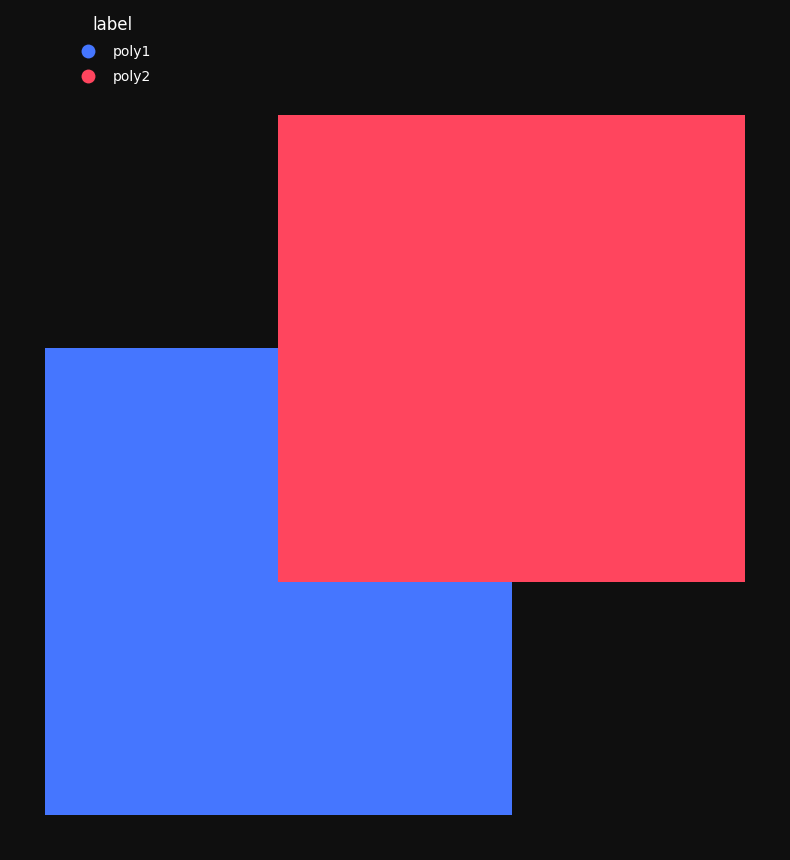

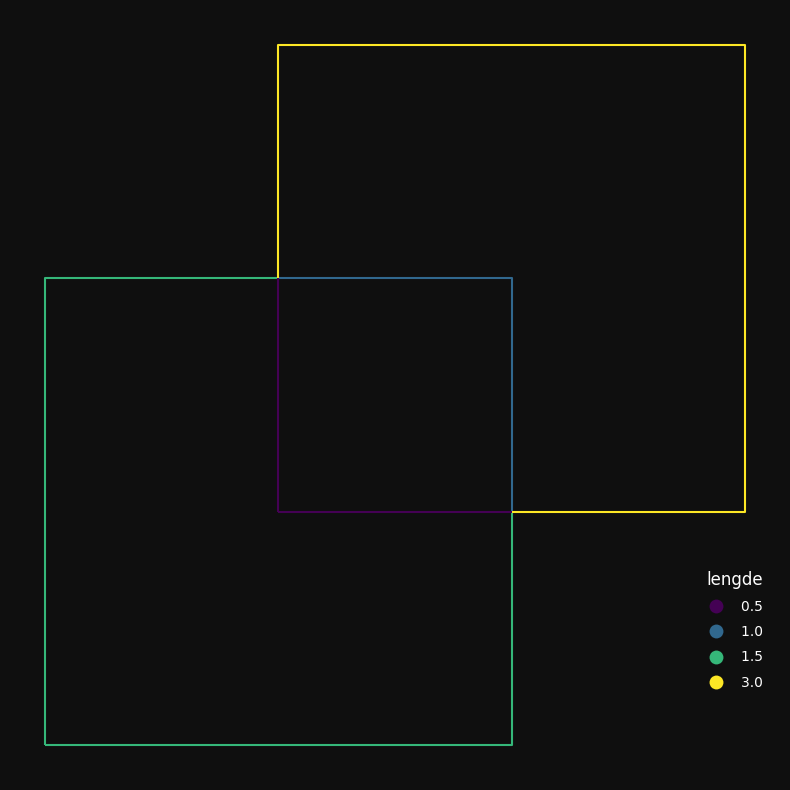

In [11]:
sg.qtm(poly1, poly2)
lines["lengde"] = lines.length
sg.qtm(lines, "lengde")

### Tette hull i polygoner
Lager et polygon med to hull.

In [12]:
kommunesti = "ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data/2022/ABAS_kommune_flate_p2022_v1.parquet"

kommuner = sg.read_geopandas(kommunesti)

kommuner

,OBJTYPE,NAVN,KOMMUNENR,FYLKE,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
0,Kommune,Oslo,0301,03,4.810366e+08,118497.084607,4.810366e+08,"MULTIPOLYGON (((253222.080 6658210.130, 253213..."
1,Kommune,Eigersund,1101,11,1.068053e+09,189082.161550,1.068053e+09,"MULTIPOLYGON (((-32368.950 6519591.960, -32344..."
2,Kommune,Stavanger,1103,11,7.808179e+08,162361.635846,7.808179e+08,"MULTIPOLYGON (((-42633.160 6593087.740, -42516..."
3,Kommune,Haugesund,1106,11,3.681692e+08,119138.132103,3.681692e+08,"MULTIPOLYGON (((-69037.300 6632413.420, -70693..."
4,Kommune,Sandnes,1108,11,1.146669e+09,237674.681416,1.146669e+09,"MULTIPOLYGON (((-1895.270 6572773.840, -2588.4..."
...,...,...,...,...,...,...,...,...
351,Kommune,Berlevåg,5440,54,2.453869e+09,201335.692534,2.453869e+09,"MULTIPOLYGON (((998634.270 7930000.890, 999355..."
352,Kommune,Deatnu,5441,54,4.386665e+09,447896.358686,4.386665e+09,"MULTIPOLYGON (((961748.280 7852517.620, 961742..."
353,Kommune,Unjárga,5442,54,1.646886e+09,189375.998494,1.646886e+09,"MULTIPOLYGON (((1000896.830 7843608.070, 10013..."
354,Kommune,Båtsfjord,5443,54,2.834512e+09,219421.063877,2.834512e+09,"MULTIPOLYGON (((1033119.220 7899727.540, 10331..."


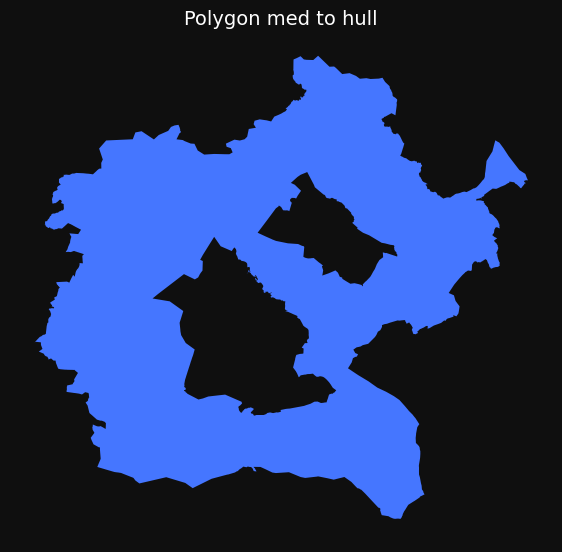

In [13]:
hol = kommuner.loc[kommuner.KOMMUNENR == "3044"]
hols_naboer = kommuner.loc[kommuner.touches(hol.unary_union)]

hemsedal = kommuner.loc[kommuner.KOMMUNENR == "3042"]
hemsedals_naboer = kommuner.loc[kommuner.touches(hemsedal.unary_union)]

polygon_med_to_hull = pd.concat([hols_naboer, hemsedals_naboer]).pipe(sg.dissexp)

sg.qtm(polygon_med_to_hull, title="Polygon med to hull", size=7, legend=False)

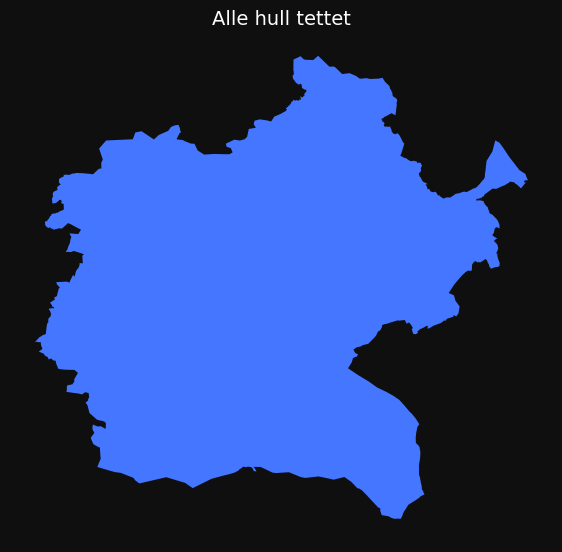

In [14]:
alle_hull_tettet = sg.close_all_holes(polygon_med_to_hull)
alle_hull_tettet
sg.qtm(alle_hull_tettet, title="Alle hull tettet", size=7, legend=False)

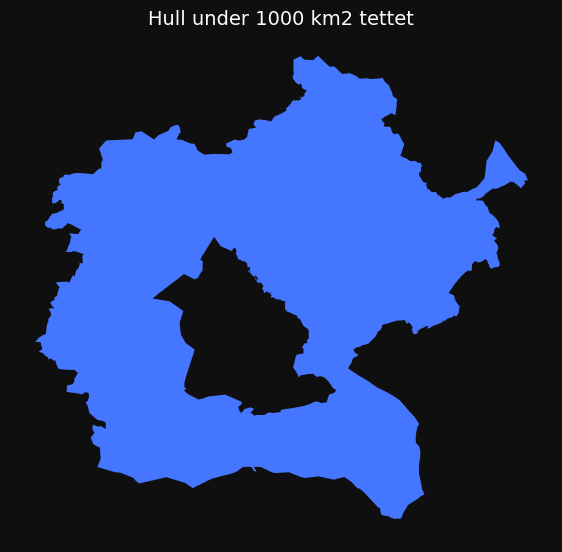

In [15]:
smaa_hull_tettet = sg.close_small_holes(polygon_med_to_hull, max_area=1000 * 1_000_000)

sg.qtm(smaa_hull_tettet, title="Hull under 1000 km2 tettet", size=7, legend=False)

### Repair geometry

Det vil si, hvis man vil reparere, fjerne tomme og manglende geometrier og beholde bare én geometritype (multi- og singlepart). 

Ler en invalid geometri:

is_valid = False


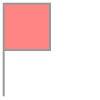

In [16]:
from shapely.geometry import Polygon
invalid_geometry = Polygon([(0,1), (0,0), (0,1),(1,1),(1,2),(0,2),(0,0)])
print("is_valid =", invalid_geometry.is_valid)
invalid_geometry

Gjør det til GeoDataFrame og legger til en tom geometri og en None-geometri.

In [17]:
invalid_geometry = sg.to_gdf(invalid_geometry)

empty_geometry = sg.to_gdf("POINT (0 0)").pipe(sg.buff, 0)

missing_geometry = gpd.GeoDataFrame(
    {"geometry": [None]}, geometry="geometry", crs=25833
)

gdf = pd.concat([invalid_geometry, missing_geometry, empty_geometry])

gdf["valid"] = gdf.is_valid

gdf

,geometry,valid
0,"POLYGON ((0.000 1.000, 0.000 0.000, 0.000 1.00...",False
0,None,False
0,POLYGON EMPTY,True


Reparering med geopandas:

In [18]:
gdf.make_valid()

0    GEOMETRYCOLLECTION (POLYGON ((0.000 2.000, 1.0...
0                                                 None
0                                        POLYGON EMPTY
dtype: geometry

For å fjerne tomme og manglende:

In [19]:
gdf = sg.clean_geoms(gdf)
gdf

,geometry,valid
0,"GEOMETRYCOLLECTION (POLYGON ((0.000 2.000, 1.0...",False


Man får likevel en geometritype som er håpløs å jobbe med (geometrycollection).

Og for å få riktig geometritype:

In [20]:
gdf = sg.to_single_geom_type(gdf, "polygon")
gdf

,geometry,valid
0,"POLYGON ((0.000 2.000, 1.000 2.000, 1.000 1.00...",False


### Snap punkter

In [21]:
snap_til = sg.buff(bygg.iloc[[0]], 500)

sg.explore(snap_til, bygg)

In [22]:
snappede_bygg = sg.snap_all(bygg, snap_til)

snappede_bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar,snittavstand_99_naboer
83363,0301,181,23.0,20110209,POINT (262037.217 6651737.733),2011,755.025448
119963,0301,181,33.0,19600901,POINT (261317.123 6652362.574),1960,607.821120
115965,0301,181,33.0,19931123,POINT (261390.743 6652482.712),1993,714.030796
51627,0301,181,22.0,19951031,POINT (262209.771 6651915.441),1995,914.597960
58181,0301,143,801.0,20070926,POINT (262118.274 6651799.516),2007,583.969488
...,...,...,...,...,...,...,...
14606,0301,181,34.0,19891003,POINT (262016.877 6651725.847),1989,796.754592
64767,0301,131,59.0,19840315,POINT (261288.042 6652054.928),1984,587.167131
34277,0301,111,105.0,19981207,POINT (261960.062 6651699.112),1998,441.629074
54588,0301,181,465.0,20200921,POINT (262206.371 6651909.479),2020,1038.772585


In [23]:
sg.explore(snap_til, snappede_bygg)

In [24]:
snappede_bygg = sg.snap_within_distance(bygg, snap_til, max_distance=5000)
snappede_bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar,snittavstand_99_naboer
83363,0301,181,23.0,20110209,POINT (262037.217 6651737.733),2011,755.025448
119963,0301,181,33.0,19600901,POINT (256423.000 6654523.000),1960,607.821120
115965,0301,181,33.0,19931123,POINT (261390.743 6652482.712),1993,714.030796
51627,0301,181,22.0,19951031,POINT (262209.771 6651915.441),1995,914.597960
58181,0301,143,801.0,20070926,POINT (262118.274 6651799.516),2007,583.969488
...,...,...,...,...,...,...,...
14606,0301,181,34.0,19891003,POINT (267124.000 6642216.000),1989,796.754592
64767,0301,131,59.0,19840315,POINT (261288.042 6652054.928),1984,587.167131
34277,0301,111,105.0,19981207,POINT (264928.000 6644099.000),1998,441.629074
54588,0301,181,465.0,20200921,POINT (262206.371 6651909.479),2020,1038.772585


In [25]:
sg.explore(snap_til, snappede_bygg)

### Forenkling av geopandas-kode

Hvis man vil bufre uten å overskrive originaldata, og slå sammen overlappende polygoner basert på flere kolonner:

In [26]:
# buffer
kopi = kommuner.copy()
kopi["geometry"] = kopi.buffer(100, resolution=50)
kopi["geometry"] = kopi["geometry"].make_valid()

# dissolve
dissolvet = kopi.dissolve(by=["KOMMUNENR", "FYLKE"], as_index=False)
dissolvet["geometry"] = dissolvet["geometry"].make_valid()

#explode
singlepart = dissolvet.explode(index_parts=False, ignore_index=True)

singlepart

,KOMMUNENR,FYLKE,OBJTYPE,NAVN,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
0,0301,03,Kommune,Oslo,4.810366e+08,118497.084607,4.810366e+08,"POLYGON ((249030.760 6661171.238, 249016.460 6..."
1,1101,11,Kommune,Eigersund,1.068053e+09,189082.161550,1.068053e+09,"POLYGON ((-32817.241 6518341.030, -32816.472 6..."
2,1103,11,Kommune,Stavanger,7.808179e+08,162361.635846,7.808179e+08,"POLYGON ((-42729.760 6593061.884, -42730.533 6..."
3,1106,11,Kommune,Haugesund,3.681692e+08,119138.132103,3.681692e+08,"POLYGON ((-69092.773 6632329.439, -70738.775 6..."
4,1108,11,Kommune,Sandnes,1.146669e+09,237674.681416,1.146669e+09,"POLYGON ((-41122.798 6558890.903, -41124.463 6..."
...,...,...,...,...,...,...,...,...
353,5440,54,Kommune,Berlevåg,2.453869e+09,201335.692534,2.453869e+09,"POLYGON ((994912.306 7897416.543, 991508.693 7..."
354,5441,54,Kommune,Deatnu,4.386665e+09,447896.358686,4.386665e+09,"POLYGON ((934373.725 7789133.631, 934368.766 7..."
355,5442,54,Kommune,Unjárga,1.646886e+09,189375.998494,1.646886e+09,"POLYGON ((1000798.805 7843627.847, 1001277.815..."
356,5443,54,Kommune,Båtsfjord,2.834512e+09,219421.063877,2.834512e+09,"POLYGON ((1033019.331 7899722.819, 1033015.432..."


Eller:

In [27]:
singlepart2 = sg.buffdissexp(kommuner, 100, by=["KOMMUNENR", "FYLKE"], as_index=False)
singlepart2

,OBJTYPE,NAVN,KOMMUNENR,FYLKE,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
0,Kommune,Oslo,0301,03,4.810366e+08,118497.084607,4.810366e+08,"POLYGON ((249030.760 6661171.238, 249016.460 6..."
1,Kommune,Eigersund,1101,11,1.068053e+09,189082.161550,1.068053e+09,"POLYGON ((-32817.241 6518341.030, -32816.472 6..."
2,Kommune,Stavanger,1103,11,7.808179e+08,162361.635846,7.808179e+08,"POLYGON ((-42729.760 6593061.884, -42730.533 6..."
3,Kommune,Haugesund,1106,11,3.681692e+08,119138.132103,3.681692e+08,"POLYGON ((-69092.773 6632329.439, -70738.775 6..."
4,Kommune,Sandnes,1108,11,1.146669e+09,237674.681416,1.146669e+09,"POLYGON ((-41122.798 6558890.903, -41124.463 6..."
...,...,...,...,...,...,...,...,...
353,Kommune,Berlevåg,5440,54,2.453869e+09,201335.692534,2.453869e+09,"POLYGON ((994912.306 7897416.543, 991508.693 7..."
354,Kommune,Deatnu,5441,54,4.386665e+09,447896.358686,4.386665e+09,"POLYGON ((934373.725 7789133.631, 934368.766 7..."
355,Kommune,Unjárga,5442,54,1.646886e+09,189375.998494,1.646886e+09,"POLYGON ((1000798.805 7843627.847, 1001277.815..."
356,Kommune,Båtsfjord,5443,54,2.834512e+09,219421.063877,2.834512e+09,"POLYGON ((1033019.331 7899722.819, 1033015.432..."


In [31]:
sg.buff(kommuner, 100)

,OBJTYPE,NAVN,KOMMUNENR,FYLKE,AREAL_GDB,SHAPE_Length,SHAPE_Area,geometry
0,Kommune,Oslo,0301,03,4.810366e+08,118497.084607,4.810366e+08,"POLYGON ((249030.760 6661171.238, 249016.460 6..."
1,Kommune,Eigersund,1101,11,1.068053e+09,189082.161550,1.068053e+09,"POLYGON ((-32817.241 6518341.030, -32816.472 6..."
2,Kommune,Stavanger,1103,11,7.808179e+08,162361.635846,7.808179e+08,"POLYGON ((-42729.760 6593061.884, -42730.533 6..."
3,Kommune,Haugesund,1106,11,3.681692e+08,119138.132103,3.681692e+08,"POLYGON ((-69092.773 6632329.439, -70738.775 6..."
4,Kommune,Sandnes,1108,11,1.146669e+09,237674.681416,1.146669e+09,"POLYGON ((-41122.798 6558890.903, -41124.463 6..."
...,...,...,...,...,...,...,...,...
351,Kommune,Berlevåg,5440,54,2.453869e+09,201335.692534,2.453869e+09,"POLYGON ((994912.306 7897416.543, 991508.693 7..."
352,Kommune,Deatnu,5441,54,4.386665e+09,447896.358686,4.386665e+09,"POLYGON ((934373.725 7789133.631, 934368.766 7..."
353,Kommune,Unjárga,5442,54,1.646886e+09,189375.998494,1.646886e+09,"POLYGON ((1000798.805 7843627.847, 1001277.815..."
354,Kommune,Båtsfjord,5443,54,2.834512e+09,219421.063877,2.834512e+09,"POLYGON ((1033019.331 7899722.819, 1033015.432..."


In [32]:
sg.dissexp(kommuner, by="FYLKE")

,AREAL_GDB,KOMMUNENR,NAVN,OBJTYPE,SHAPE_Area,SHAPE_Length,geometry
FYLKE,,,,,,,
03,4.810366e+08,0301,Oslo,Kommune,4.810366e+08,118497.084607,"POLYGON ((253222.080 6658210.130, 253213.550 6..."
11,1.068053e+09,1101,Eigersund,Kommune,1.068053e+09,189082.161550,"POLYGON ((-56493.690 6508636.440, -59095.100 6..."
15,6.712581e+08,1505,Kristiansund,Kommune,6.712581e+08,144771.170588,"POLYGON ((104161.500 6907210.720, 104544.500 6..."
18,4.823084e+09,1804,Bodø,Kommune,4.823084e+09,382980.996878,"POLYGON ((355520.870 7222532.780, 355519.380 7..."
30,6.615597e+08,3001,Halden,Kommune,6.615597e+08,149961.340183,"POLYGON ((185190.670 6626164.670, 184993.840 6..."
34,1.036228e+09,3401,Kongsvinger,Kommune,1.036228e+09,201850.422546,"POLYGON ((190043.010 6740694.680, 190037.890 6..."
38,3.714014e+08,3813,Bamble,Kommune,3.714014e+08,87424.047590,"POLYGON ((187026.350 6607473.790, 187031.200 6..."
42,5.858170e+08,4201,Risør,Kommune,5.858170e+08,126090.649046,"POLYGON ((74935.480 6428254.040, 74211.540 642..."
46,5.736759e+08,4601,Bergen,Kommune,5.736759e+08,130775.266420,"POLYGON ((-32673.700 6646701.810, -32756.210 6..."


In [33]:
sg.buffdiss(kommuner, 100, by="FYLKE")

,AREAL_GDB,KOMMUNENR,NAVN,OBJTYPE,SHAPE_Area,SHAPE_Length,geometry
FYLKE,,,,,,,
03,4.810366e+08,0301,Oslo,Kommune,4.810366e+08,118497.084607,"POLYGON ((249030.760 6661171.238, 249016.460 6..."
11,1.068053e+09,1101,Eigersund,Kommune,1.068053e+09,189082.161550,"POLYGON ((-54116.885 6504826.326, -56577.335 6..."
15,6.712581e+08,1505,Kristiansund,Kommune,6.712581e+08,144771.170588,"POLYGON ((104306.314 6907216.910, 104610.337 6..."
18,4.823084e+09,1804,Bodø,Kommune,4.823084e+09,382980.996878,"POLYGON ((355416.931 7222351.162, 355420.131 7..."
30,6.615597e+08,3001,Halden,Kommune,6.615597e+08,149961.340183,"POLYGON ((181882.512 6634686.894, 181836.711 6..."
34,1.036228e+09,3401,Kongsvinger,Kommune,1.036228e+09,201850.422546,"POLYGON ((189908.458 6740638.635, 189906.525 6..."
38,3.714014e+08,3813,Bamble,Kommune,3.714014e+08,87424.047590,"POLYGON ((163565.412 6541879.361, 163562.863 6..."
42,5.858170e+08,4201,Risør,Kommune,5.858170e+08,126090.649046,"POLYGON ((77278.528 6428849.472, 74964.098 642..."
46,5.736759e+08,4601,Bergen,Kommune,5.736759e+08,130775.266420,"POLYGON ((-29481.600 6655233.190, -29481.644 6..."
